In [1]:
from diffmain import *
from DataL import *
import glob
import sys
import os
import re
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import pdb
from tqdm import tqdm
from torch.utils.data import DataLoader, random_split
from sketch_condition_unet import SketchUNet, smallSketchUNet
from simpleAE import myAE
#from vae import VAE


In [2]:
#---------------Load VAE and AE models-------------------
AE = torch.load('sketch_AE_v1_4classes.pth')
VAE = torch.load('VAE_v1_4classes.pth')
print("Models loaded successfully.")
#----------------Load dataset---------------------------
transform = transforms.Compose([transforms.ToTensor()])
SketchySet = get_sketchimageclass('tiger', 'dog', 'cat', 'zebra', transform=transform, size=256, rgb=False)
#SketchySet = create_smaller_dataset(SketchySet, 100)
dataset_size = len(SketchySet)
train_size = int(0.95 * dataset_size)
val_size = dataset_size - train_size
train_dataset, val_dataset = random_split(SketchySet, [train_size, val_size])
#----------------------Load UNet model-------------------

classes = ['tiger', 'dog', 'cat', 'zebra']
unet = torch.load("imagesv5_29-04_02:06/final_modelV5.pth", map_location='cuda')
print("unet loaded successfully.")

Models loaded successfully.
Pairs:  2
unet loaded successfully.


In [3]:
loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
diffusion = GuassianDiffusion(1000, device = device)

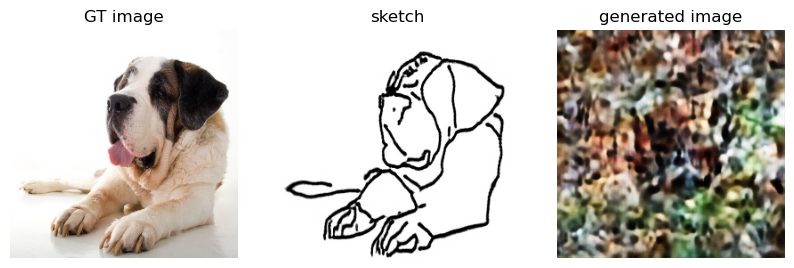

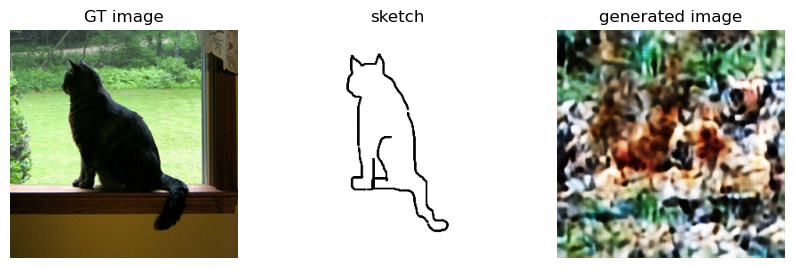

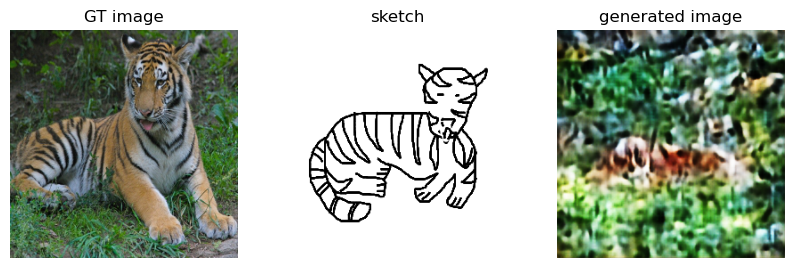

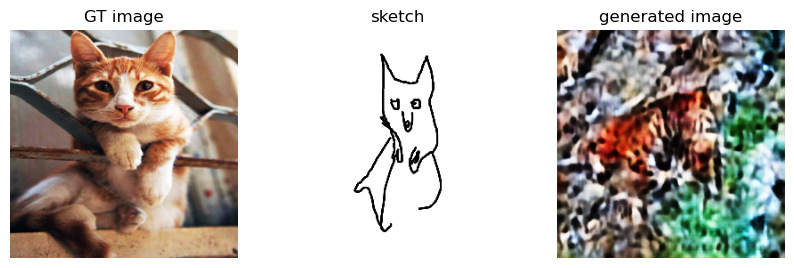

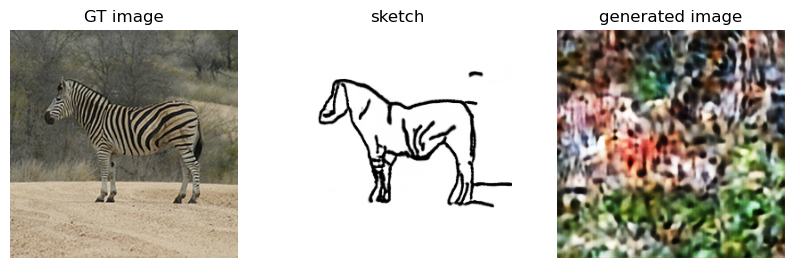

...

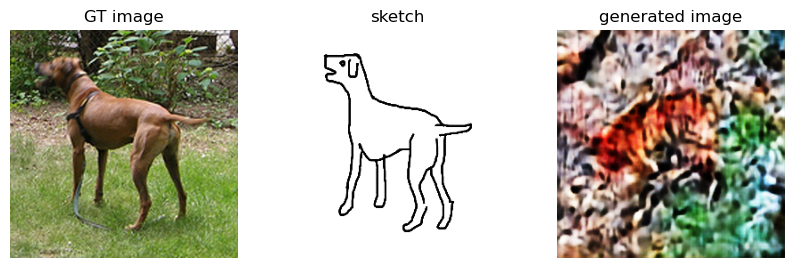

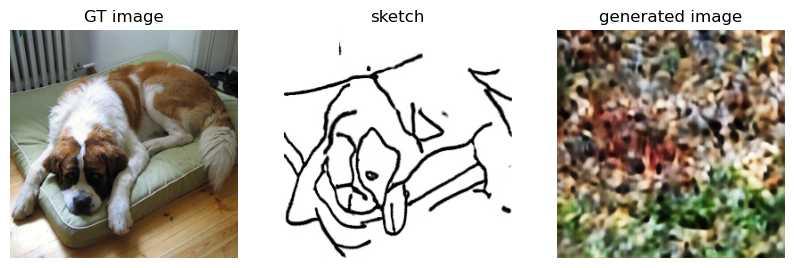

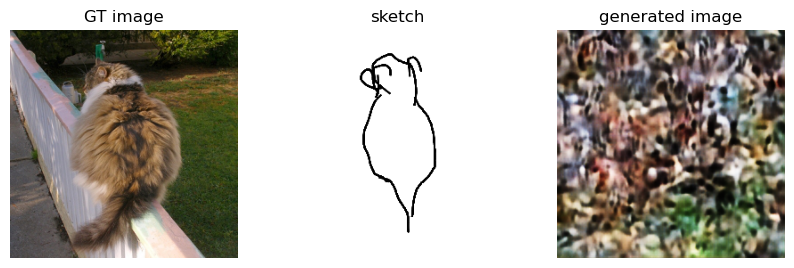

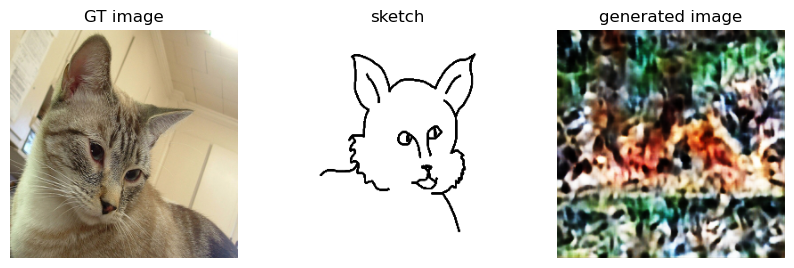

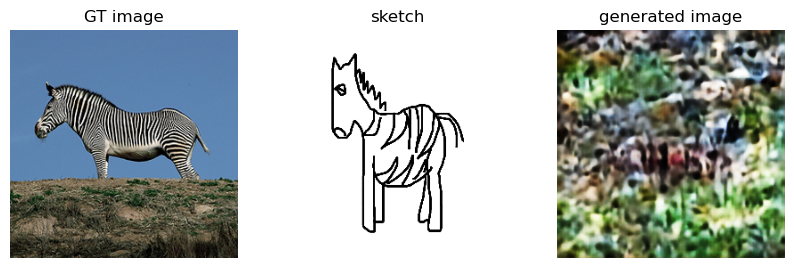

In [4]:
#-------------------------creation test--------------------------
sketch, photo = next((iter(val_loader)))
#images, sketches = (2 * images.to(device) - 1, sketches.to(device))
sketch = sketch.to(device)
photo = photo.to(device)
#label=label.to(device)
#label = torch.LongTensor([classes.index(s) for s in label]).to(device)
latent_sketches = AE.encoder(sketch).detach()

latent_image = torch.randn((sketch.size(0), VAE.latent_dim, 32, 32), device=device)
#latent_image = VAE.encoder(photo).detach()

#latent_image = VAE.encoder(latent_image).detach()
#image_mu = VAE.mu(latent_image)
#image_logvar = VAE.logvar(latent_image)

#latent_image = VAE.reparameterize(image_mu, image_logvar)

t = torch.full((latent_image.size(0),) , diffusion.timesteps - 1, dtype=torch.int64).to(device)
#t = torch.randint(0, diffusion.timesteps, (latent_image.size(0),), device=device)

xt, eps = diffusion.sample_from_forward_process(latent_image, t)
#pred_eps = unet(xt, t, y = None, sketch=latent_sketch)
pred_eps=diffusion.sample_from_reverse_process(unet, xt, diffusion.timesteps, model_kwargs={'sketch':latent_sketches}, ddim=True)

final_gen = VAE.decoder(pred_eps)

for i in range(32):
    fig, ax = plt.subplots(1,3,figsize=(10,5))
    ax[0].imshow(photo[i].cpu().permute(1, 2, 0).detach().numpy())
    ax[0].set_title('GT image')
    ax[0].axis('off')

    ax[1].imshow(sketch[i].cpu().permute(1, 2, 0).detach().numpy(), cmap='gray')
    ax[1].set_title('sketch')
    ax[1].axis('off')

    ax[2].imshow(final_gen[i].cpu().permute(1, 2, 0).detach().numpy())
    ax[2].set_title('generated image')
    ax[2].axis('off')
    plt.show()